<a href="https://colab.research.google.com/github/rodolfostocker/PO_RStocker_BI_Master_POc_Schedule/blob/main/PO_RStocker_BI_Master_POC_Scheduling_rev0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

####**Trabalho de Conclusão da Disciplina PO.**
####**Programação otimizada de um cronograma de projeto de ciência de dados com recursos limitados.**

##### Aluno Bi Master 2019_4 Puc Rio: Rodolfo Gustavo Stocker.
##### Matricula: 192110243

**Programação de projetos com restrições de recursos**, como seu nome o indica, este tipo de problema é o conhecido problema de programação de projetos com restrição de recursos.

***Shifts Optimization or Scheduling projects with resource constraints***, is the well-known resource-constrained project scheduling problem.

#### Resumo 
 A programação eficaz de projetos em qualquer setor de negócio é ​​uma das partes chaves. Vários métodos com programação para recursos limitados estão sendo experimentados na indústria. Neste trabalho de conclusão da disciplina PO, propomos uma abordagem para o planejamento de projetos com recursos limitados usando um algoritmo genético e comprovamos sua eficácia por meio de resultados experimentais a nível do código.

#### Summary  

Effective scheduling of projects in any business sector is one of the most important drivers. Severals methods with scheduling for limited resources are being tried in the industry. In this business case, I propose an approach to project scheduling with limited resources using a genetic algorithm, and prove its effectiveness through experimental results.


#### Introdução

O sistema de gerenciamento de projetos se espalhou por todo o mundo, é reconhecido como um das metodologias determinantes do sucesso do projeto e contribui para o valor da empresa.
Muitos métodos foram testados para um ótimo planejamento dos projetos, com os algoritmos genéticos, também sendo testados.
O algoritmo genético é um algoritmo que resolve problemas de otimização modelando  a “lei da sobrevivência do mais apto” e o “princípio da evolução ” no mundo natural.

**Eu proponho usar um algoritmo genético para a programação otimizada de um cronograma de projeto de ciência de dados com recursos limitados.**


Como responsável pela ** POC ** (Prova de Conceito) ** para conclusão da pós-graduação em BI Master Data Science, fui encarregado de providenciar o escopo do trabalho, o fluxo de trabalho e o cronograma para atender a tal restrição com Prazo para 31 de julho, tendo dias de turnos e recursos limitados para realizar o POC a tempo nas próximas semanas. **
tem ** três turnos no dia: manhã, tarde e noite ** disponíveis  ,sendo que, algumas pessoas se sentem mais confortáveis ​​e realizam melhores trabalhos à noite. Assim,** preciso designar um ou cinco colegas no máximo com permissão para trabalhar no POC. ** Com a ideia principal de envolver pessoas qualificadas.

#### Introduction

 The project management system has spread all over the world and is recognized as one of the important determinants of project success, and the project management system increases and contributes to the value of the enterprise. Therefore, companies are using the project management system.
 
The genetic algorithm is an algorithm that solves optimization problems by mathematically modeling the “law of survival of the fittest” and “principle of gene evolution” in the natural world. Currently, these genetic algorithms are being applied in many fields and have been proven to be effective for optimization problems. In this work, **I propose a genetic algorithm for optimized scheduling in a Data science project scheduling with limited resources.**

As a person responsible for **the POC** (Proof of Concept) **to conclude the post graduation of BI Master Data Science, I was in charged to arrange the scope of work, the workflow and the schedule to fulfill the constraint such as: Deadline July 31st, Shifts days and the Limited Resources to accomplish the POC on time in the next weeks.**
there are **three shifts in a day, morning, afternoon and night** availables and for each shift, because maybe some people feel comfortable or perform better works at night. I **need to assign one or five colleague max allowed to work in the POC.** With the main idea to engage skilled people to work together in the POC Devop.

##### Instalação da biblioteca DEAP / Installinng DEAP Framework (Distributed Evolutionary Algorithms in Python)

In [ ]:
!pip install deap 

     |████████████████████████████████| 160 kB 5.4 MB/s 


##### **Shifts Partner Problem Coding**

In [ ]:
import numpy as np



class PartnerSchedulingProblem:  
    """This class encapsulates the Partner Scheduling problem
    """
    def __init__(self, hardConstraintPenalty):
        """
        :param hardConstraintPenalty: the penalty factor for a hard-constraint violation
        """
        self.hardConstraintPenalty = hardConstraintPenalty


        # list of partners:
        self.partners = ['A', 'B', 'C', 'D', 'E']

        # partners' respective shift preferences - morning, evening, night:
        self.shiftPreference = [[1, 0, 0], [1, 1, 0], [0, 0, 1], [0, 1, 0], [0, 0, 1]]

        # min and max number of partners allowed for each shift - morning, evening, night:
        self.shiftMin = [1, 1, 1]
        self.shiftMax = [2, 2, 1]

        # max shifts per week allowed for each partner
        self.maxShiftsPerWeek = 5

        # number of weeks we create a schedule for:
        self.weeks = 1

        # useful values:
        self.shiftPerDay = len(self.shiftMin)
        self.shiftsPerWeek = 7 * self.shiftPerDay

    def __len__(self):
        """
        :return: the number of shifts in the schedule
        """
        return len(self.partners) * self.shiftsPerWeek * self.weeks


    def getCost(self, schedule):
        """
        Calculates the total cost of the various violations in the given schedule
        ...
        :param schedule: a list of binary values describing the given schedule
        :return: the calculated cost
        """

        if len(schedule) != self.__len__():
            raise ValueError("size of schedule list should be equal to ", self.__len__())

        # convert entire schedule into a dictionary with a separate schedule for each partner:
        partnerShiftsDict = self.getPartnerShifts(schedule)

        # count the various violations:
        consecutiveShiftViolations = self.countConsecutiveShiftViolations(partnerShiftsDict)
        shiftsPerWeekViolations = self.countShiftsPerWeekViolations(partnerShiftsDict)[1]
        partnersPerShiftViolations = self.countPartnersPerShiftViolations(partnerShiftsDict)[1]
        shiftPreferenceViolations = self.countShiftPreferenceViolations(partnerShiftsDict)

        # calculate the cost of the violations:
        hardContstraintViolations = consecutiveShiftViolations + partnersPerShiftViolations + shiftsPerWeekViolations
        softContstraintViolations = shiftPreferenceViolations

        return self.hardConstraintPenalty * hardContstraintViolations + softContstraintViolations


    def getPartnerShifts(self, schedule):
        """
        Converts the entire schedule into a dictionary with a separate schedule for each partner
        :param schedule: a list of binary values describing the given schedule
        :return: a dictionary with each partner as a key and the corresponding shifts as the value
        """        
        shiftsPerPartner = self.__len__() // len(self.partners)
        partnerShiftsDict = {}
        shiftIndex = 0

        for partner in self.partners:  
            partnerShiftsDict[partner] = schedule[shiftIndex:shiftIndex + shiftsPerPartner]
            shiftIndex += shiftsPerPartner
            
        return partnerShiftsDict

    def countConsecutiveShiftViolations(self, partnerShiftsDict):      
        """
        Counts the consecutive shift violations in the schedule
        :param partnerShiftsDict: a dictionary with a separate schedule for each partner
        :return: count of violations found
        """

        violations = 0
        # iterate over the shifts of each partner:
        for partnerShifts in partnerShiftsDict.values():
            # look for two cosecutive '1's:
            for shift1, shift2 in zip(partnerShifts, partnerShifts[1:]):              
                if shift1 == 1 and shift2 == 1:
                    violations += 1
        return violations

    def countShiftsPerWeekViolations(self, partnerShiftsDict):
        """
        Counts the max-shifts-per-week violations in the schedule
        :param partnerShiftsDict: a dictionary with a separate schedule for each partner
        :return: count of violations found
        """
        violations = 0
        weeklyShiftsList = []
        # iterate over the shifts of each partner:        
        for partnerShifts in partnerShiftsDict.values():  # all shifts of a single partner        
            # iterate over the shifts of each weeks:
            for i in range(0, self.weeks * self.shiftsPerWeek, self.shiftsPerWeek):
                # count all the '1's over the week:
                weeklyShifts = sum(partnerShifts[i:i + self.shiftsPerWeek])                
                weeklyShiftsList.append(weeklyShifts)
                if weeklyShifts > self.maxShiftsPerWeek:
                    violations += weeklyShifts - self.maxShiftsPerWeek

        return weeklyShiftsList, violations

    def countPartnersPerShiftViolations(self, partnerShiftsDict):      
        """
        Counts the number-of-partners-per-shift violations in the schedule
        :param partnerShiftsDict: a dictionary with a separate schedule for each partner
        :return: count of violations found
        """        
        # sum the shifts over all partners:        
        totalPerShiftList = [sum(shift) for shift in zip(*partnerShiftsDict.values())]
        violations = 0
        # iterate over all shifts and count violations:
        for shiftIndex, numOfPartners in enumerate(totalPerShiftList):
            dailyShiftIndex = shiftIndex % self.shiftPerDay  # -> 0, 1, or 2 for the 3 shifts per day
            if (numOfPartners > self.shiftMax[dailyShiftIndex]):  
                violations += numOfPartners - self.shiftMax[dailyShiftIndex]
            elif (numOfPartners < self.shiftMin[dailyShiftIndex]):  
                violations += self.shiftMin[dailyShiftIndex] - numOfPartners

        return totalPerShiftList, violations

    def countShiftPreferenceViolations(self, partnerShiftsDict):      
        """
        Counts the partner-preferences violations in the schedule
        :param partnerShiftsDict: a dictionary with a separate schedule for each partner
        :return: count of violations found
        """
        violations = 0
        for partnerIndex, shiftPreference in enumerate(self.shiftPreference):          
            # duplicate the shift-preference over the days of the period
            preference = shiftPreference * (self.shiftsPerWeek // self.shiftPerDay)
            # iterate over the shifts and compare to preferences:
            shifts = partnerShiftsDict[self.partners[partnerIndex]]            
            for pref, shift in zip(preference, shifts):
                if pref == 0 and shift == 1:
                    violations += 1

        return violations

    def printScheduleInfo(self, schedule):
        """
        Prints the schedule and violations details
        :param schedule: a list of binary values describing the given schedule
        """
        partnerShiftsDict = self.getPartnerShifts(schedule)        

        print("Schedule for each partner:")        
        for partner in partnerShiftsDict:  # all shifts of a single partner        
            print(partner, ":", partnerShiftsDict[partner])            

        print("consecutive shift violations = ", self.countConsecutiveShiftViolations(partnerShiftsDict))
        print()

        weeklyShiftsList, violations = self.countShiftsPerWeekViolations(partnerShiftsDict)
        print("weekly Shifts = ", weeklyShiftsList)
        print("Shifts Per Week Violations = ", violations)
        print()

        totalPerShiftList, violations = self.countPartnersPerShiftViolations(partnerShiftsDict)
        print("Partners Per Shift = ", totalPerShiftList)        
        print("Partners Per Shift Violations = ", violations)
        print()

        shiftPreferenceViolations = self.countShiftPreferenceViolations(partnerShiftsDict)
        print("Shift Preference Violations = ", shiftPreferenceViolations)
        print()


# testing the class:
def main():
    # create a problem instance:
    partners = PartnerSchedulingProblem(10)
    randomSolution = np.random.randint(2, size=len(partners))    
    print("Random Solution = ")
    print(randomSolution)
    print()

    partners.printScheduleInfo(randomSolution)
    print("Total Cost = ", partners.getCost(randomSolution))

if __name__ == "__main__":
    main()

Random Solution = 
[1 1 0 1 1 1 0 1 0 1 1 1 1 1 1 0 0 0 1 0 1 0 0 0 1 1 1 1 0 1 1 0 1 0 1 1 0
 0 1 1 1 0 0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1 1 1 0 1 1 0 0 0 0 0 1 0 1 0 0
 1 0 1 0 1 1 0 0 0 0 0 1 0 0 0 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1 1]

Schedule for each partner:
A : [1 1 0 1 1 1 0 1 0 1 1 1 1 1 1 0 0 0 1 0 1]
B : [0 0 0 1 1 1 1 0 1 1 0 1 0 1 1 0 0 1 1 1 0]
C : [0 1 0 1 0 1 0 0 0 0 0 0 1 0 1 0 1 1 1 0 1]
D : [1 0 0 0 0 0 1 0 1 0 0 1 0 1 0 1 1 0 0 0 0]
E : [0 1 0 0 0 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1 1]
consecutive shift violations =  21

weekly Shifts =  [14, 12, 9, 7, 8]
Shifts Per Week Violations =  25

Partners Per Shift =  [2, 3, 0, 3, 2, 4, 3, 1, 2, 2, 1, 4, 2, 4, 4, 1, 2, 2, 3, 2, 3]
Partners Per Shift Violations =  20

Shift Preference Violations =  28

Total Cost =  688


##### **Instalação dos Operadores DEAP / Installing DEAP Libraries (functions)  and others**

In [ ]:
import random
import numpy

from deap import base
from deap import creator
from deap import tools
from deap import algorithms
import math
import pandas as pd

#### **Hans-On Partner Scheduling Problem with GA**

In [ ]:
# problem constants:
HARD_CONSTRAINT_PENALTY = 10  # the penalty factor for a hard-constraint violation

# Genetic Algorithm constants:
POPULATION_SIZE = 300
P_CROSSOVER = 0.9  # probability for crossover
P_MUTATION = 0.1   # probability for mutating an individual
MAX_GENERATIONS = 200
HALL_OF_FAME_SIZE = 30

# set the random seed:
RANDOM_SEED = 42
random.seed(RANDOM_SEED)


toolbox = base.Toolbox()


psp = PartnerSchedulingProblem(HARD_CONSTRAINT_PENALTY)


# define a single objective, minimizing fitness strategy:
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))

# create the Individual class based on list:
creator.create("Individual", list, fitness=creator.FitnessMin)

# create an operator that randomly returns 0 or 1:
toolbox.register("zeroOrOne", random.randint, 0, 1)

# create the individual operator to fill up an Individual instance:
toolbox.register("individualCreator", tools.initRepeat, creator.Individual, toolbox.zeroOrOne, len(psp))

# create the population operator to generate a list of individuals:
toolbox.register("populationCreator", tools.initRepeat, list, toolbox.individualCreator)


# fitness calculation
def getCost(individual):
    return psp.getCost(individual),  # return a tuple


toolbox.register("evaluate", getCost)

# genetic operators:
toolbox.register("select", tools.selTournament, tournsize=2)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", tools.mutFlipBit, indpb=1.0/len(psp))


# Genetic Algorithm flow:
def main():

    # create initial population (generation 0):
    population = toolbox.populationCreator(n=POPULATION_SIZE)

    # prepare the statistics object:
    stats = tools.Statistics(lambda ind: ind.fitness.values)
    stats.register("min", numpy.min)
    stats.register("avg", numpy.mean)

    # define the hall-of-fame object:
    hof = tools.HallOfFame(HALL_OF_FAME_SIZE)

    # perform the Genetic Algorithm flow with hof feature added:

    # print best solution found:
    best = hof.items[0]
    print("-- Best Individual = ", best)
    print("-- Best Fitness = ", best.fitness.values[0])
    print()
    print("-- Schedule = ")
    nsp.printScheduleInfo(best)

In [ ]:
# Pop initialization
pop = toolbox.populationCreator(n=100) # initial population size

# Best One
hof = tools.HallOfFame(HALL_OF_FAME_SIZE)                 

# Statistics
stats = tools.Statistics(lambda ind: ind.fitness.values)   
stats.register("avg", numpy.mean)
stats.register("std", numpy.std)
stats.register("min", numpy.min)
stats.register("max", numpy.max)

In [ ]:
#pop, log = algorithms.eaSimple(pop, toolbox, cxpb=0.7, mutpb=0.3, ngen=80, stats=stats, halloffame=hof, verbose=True) 
pop, log = algorithms.eaSimple(pop, toolbox, cxpb=0.6, mutpb=0.5, ngen=500, stats=stats, halloffame=hof, verbose=True) 

gen	nevals	avg   	std    	min	max 
0  	100   	743.38	149.376	394	1158
1  	86    	668.96	120.341	417	1002
2  	72    	600.7 	113.426	374	1028
3  	81    	557.91	99.7981	334	814 
4  	77    	515.2 	84.4082	290	732 
5  	82    	464.83	71.5016	293	648 
6  	77    	429   	61.7673	232	605 
7  	79    	401.59	70.9294	232	583 
8  	77    	363.96	62.7337	232	523 
9  	90    	343.71	66.4893	221	537 
10 	74    	313.63	55.5992	221	464 
11 	85    	294.69	48.81  	203	436 
12 	82    	271.98	50.1099	167	496 
13 	85    	250.22	45.7678	130	424 
14 	81    	230.43	43.6633	117	350 
15 	83    	211.38	39.2675	130	323 
16 	80    	200.21	46.1418	114	321 
17 	86    	186.09	41.6769	96 	314 
18 	86    	172.86	35.2973	96 	287 
19 	81    	157.76	34.1799	96 	253 
20 	89    	147.06	31.6012	96 	249 
21 	87    	137.79	27.1114	85 	226 
22 	84    	134.33	32.7881	72 	229 
23 	74    	127.54	29.9945	72 	220 
24 	85    	125.85	32.5909	55 	219 
25 	77    	119.97	28.8965	60 	201 
26 	74    	112.66	26.9812	62 	186 
27 	84    	107.57	23

In [ ]:
# Best solution
print("Melhor Indivíduo:")
print(hof[0])

# Best result of objective function
print("Melhor Resultado da Função Objetivo:")

PartnerSchedulingProblem(hof[0])

Melhor Indivíduo:
[0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0]
Melhor Resultado da Função Objetivo:


In [ ]:
# Import Visualization Libraries
import matplotlib.pyplot as plt
from matplotlib import style
style.use('dark_background')
from pylab import rcParams
rcParams['figure.figsize'] = 14, 8

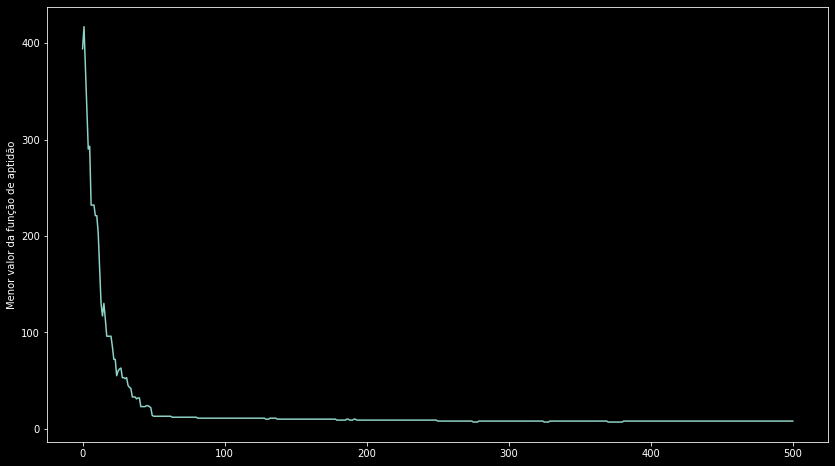

In [ ]:
# Plot Fitness over generations
gen, minVal = log.select("gen", "min")
plt.plot(gen, minVal)
plt.ylabel('Menor valor da função de aptidão')
plt.show()

In [ ]:
# Set initial population
#population = toolbox.populationCreator(n=300)
population = toolbox.populationCreator(n=100)
# Qty of generations
NGEN=500
bestIndEachGeneration = []
bestInd = []
for gen in range(NGEN):
  print("Geracao: ", gen)
#  offspring = algorithms.varAnd(population, toolbox, cxpb=0.5, mutpb=0.1)
  offspring = algorithms.varAnd(population, toolbox, cxpb=0.6, mutpb=0.5)
  fits = list(toolbox.map(toolbox.evaluate, offspring))
  
  indexes = range(len(offspring))
  indexes = [x for _,x in sorted(zip(fits, indexes))]
  fits = [fits[x] for x in indexes]
  offspring = [offspring[x] for x in indexes]
  print(offspring)
  print(fits)
  for fit, ind in zip(fits, offspring):
    ind.fitness.wvalues = fit
  elites_ind = offspring[:max(1, round(0.15*len(offspring)))]
  population = toolbox.select(offspring, len(population)-len(elites_ind))
  population.extend(elites_ind)
  bestIndEachGeneration.append([offspring[fits.index(min(fits))], min(fits)])
  bestInd.append(min(bestIndEachGeneration, key=lambda t:t[1])[1])
  print(" Melhor Avaliação dessa geração: ", bestIndEachGeneration[-1][1], "\n", 
        "Melhor Avaliação Geral", min(bestIndEachGeneration, key=lambda t:t[1])[1], "\n",
        "Da geração: ", bestIndEachGeneration.index(min(bestIndEachGeneration, key=lambda t:t[1])), "\n",
        "Cromossomo: ", min(bestIndEachGeneration, key=lambda t:t[1])[0], "\n"
       )


Geracao:  0
[[1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0], [0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0], [1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1], [1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0], [0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], [0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0], [1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0], [0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1], [1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1], [0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[(744,), (766,), (797,), (820,), (836,), (856,), (871,), (875,), (888,), (943,), (946,), (960,), (960,), (979,), (1019,), (2229,), (2309,), (2320,), (2350,), (2358,), (2369,), (2400,), (2442,), (2442,), (2442,), (2451,), (2481,), (2481,), (2481,), (2481,), (2481,), (2481,), (2481,), (2481,), (2482,), (2482,), (2482,), (2483,), (2483,), (2491,), (2492,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2522,), (2523,), (2523,), (2523,), (2523,), (2523,), (2523,), (2532,), (2532,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,), (2563,)]
 Melhor Avaliação dessa geração:  (744,) 
 Melhor Avaliação Geral (287,) 
 Da geração:  30 
 Cromossomo:  [0, 0,

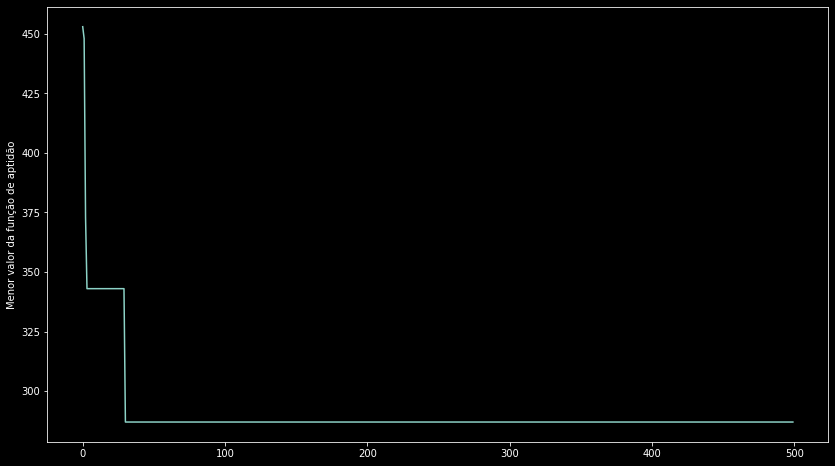

In [ ]:
# Plot Fitness over generations
plt.plot(bestInd)
plt.ylabel('Menor valor da função de aptidão')
plt.show()

In [ ]:
!pip install ortools

     |████████████████████████████████| 14.4 MB 91 kB/s 


##### **Others Libraries explored**

In [ ]:
from ortools.sat.python import cp_model


class ColleaguesPartialSolutionPrinter(cp_model.CpSolverSolutionCallback):
    """Print intermediate solutions."""

    def __init__(self, shifts, num_colleagues, num_days, num_shifts, sols):
        cp_model.CpSolverSolutionCallback.__init__(self)
        self._shifts = shifts
        self._num_colleagues = num_colleagues
        self._num_days = num_days
        self._num_shifts = num_shifts
        self._solutions = set(sols)
        self._solution_count = 0


    def on_solution_callback(self):
        if self._solution_count in self._solutions:
            print('Solution %i' % self._solution_count)
            for d in range(self._num_days):
                print('Day %i' % d)
                for n in range(self._num_colleagues):
                    is_working = False
                    for s in range(self._num_shifts):
                        if self.Value(self._shifts[(n, d, s)]):
                            is_working = True
                            print('  Colleague %i works shift %i' % (n, s))
                    if not is_working:
                        print('  Colleague {} does not work'.format(n))
            print()
        self._solution_count += 1

    def solution_count(self):
        return self._solution_count



def main():
    # Data.
    num_colleagues = 5
    num_shifts = 3
    num_days = 4
    all_colleagues = range(num_colleagues)
    all_shifts = range(num_shifts)
    all_days = range(num_days)
    # Creates the model.
    model = cp_model.CpModel()


    # Creates shift variables.
    # shifts[(n, d, s)]: colleague 'n' works shift 's' on day 'd'.
    shifts = {}
    for n in all_colleagues:
        for d in all_days:
            for s in all_shifts:
                shifts[(n, d,
                        s)] = model.NewBoolVar('shift_n%id%is%i' % (n, d, s))


    # Each shift is assigned to exactly one nurse in the schedule period.
    for d in all_days:
        for s in all_shifts:
            model.Add(sum(shifts[(n, d, s)] for n in all_colleagues) == 1)            


    # Each colleague works at most one shift per day.
    for n in all_colleagues:
        for d in all_days:
            model.Add(sum(shifts[(n, d, s)] for s in all_shifts) <= 1)            


    # Try to distribute the shifts evenly, so that each colleague works
    # min_shifts_per_colleague shifts. If this is not possible, because the total
    # number of shifts is not divisible by the number of colleagues, some colleagues will
    # be assigned one more shift.
    min_shifts_per_colleague = (num_shifts * num_days) // num_colleagues
    if num_shifts * num_days % num_colleagues == 0:
        max_shifts_per_colleague = min_shifts_per_colleague
    else:
        max_shifts_per_colleague = min_shifts_per_colleague + 1
    for n in all_colleagues:
        num_shifts_worked = 0
        for d in all_days:
            for s in all_shifts:
                num_shifts_worked += shifts[(n, d, s)]
        model.Add(min_shifts_per_colleague <= num_shifts_worked)
        model.Add(num_shifts_worked <= max_shifts_per_colleague)

    # Creates the solver and solve.
    solver = cp_model.CpSolver()
    solver.parameters.linearization_level = 0
    # Display the first five solutions.
    a_few_solutions = range(5)
    solution_printer = ColleaguesPartialSolutionPrinter(shifts, num_colleagues,
                                                    num_days, num_shifts,
                                                    a_few_solutions)
    solver.SearchForAllSolutions(model, solution_printer)

    # Statistics.
    print()
    print('Statistics')
    print('  - conflicts       : %i' % solver.NumConflicts())
    print('  - branches        : %i' % solver.NumBranches())
    print('  - wall time       : %f s' % solver.WallTime())
    print('  - solutions found : %i' % solution_printer.solution_count())


if __name__ == '__main__':
    main()

Solution 0
Day 0
  Colleague 0 does not work
  Colleague 1 works shift 0
  Colleague 2 does not work
  Colleague 3 works shift 1
  Colleague 4 works shift 2
Day 1
  Colleague 0 does not work
  Colleague 1 does not work
  Colleague 2 works shift 2
  Colleague 3 works shift 1
  Colleague 4 works shift 0
Day 2
  Colleague 0 works shift 2
  Colleague 1 works shift 1
  Colleague 2 works shift 0
  Colleague 3 does not work
  Colleague 4 does not work
Day 3
  Colleague 0 works shift 1
  Colleague 1 works shift 2
  Colleague 2 works shift 0
  Colleague 3 does not work
  Colleague 4 does not work

Solution 1
Day 0
  Colleague 0 does not work
  Colleague 1 works shift 0
  Colleague 2 does not work
  Colleague 3 works shift 1
  Colleague 4 works shift 2
Day 1
  Colleague 0 works shift 2
  Colleague 1 does not work
  Colleague 2 does not work
  Colleague 3 works shift 1
  Colleague 4 works shift 0
Day 2
  Colleague 0 works shift 2
  Colleague 1 works shift 1
  Colleague 2 works shift 0
  Colleague